# 인물사진을 만들어 보자 [프로젝트]

# [ 목차 ]
- Step 1. 인물모드 직접 해 보기
- Step 2. 사진에서 문제점 찾기
- **Step 3. 해결 방법을 제안해 보기**

In [1]:
# 패키지 설치 및 버전 확인
import os
import torch
import numpy as np
import cv2
import matplotlib
import pandas as pd
import ultralytics

# NumPy 강제 재로드 (캐시 문제 방지)
import importlib
importlib.reload(np)

print(torch.__version__)
print(np.__version__)
print(cv2.__version__)
print(matplotlib.__version__)
print(pd.__version__)
print(ultralytics.__version__)

2.6.0+cu124
1.23.0
4.11.0
3.9.4
2.2.3
8.3.88


/opt/conda/lib/python3.9/importlib/__init__.py:169: UserWarning: The NumPy module was reloaded (imported a second time). This can in some cases result in small but subtle issues and is discouraged.
  _bootstrap._exec(spec, module)


## Step 3. 해결 방법을 제안해 보기
- 여러분이 만든 인물모드 사진의 문제점을 해결할 방안을 정리하여 제안해 주시기 바랍니다.
- 단순히 'XXX 기술을 사용한다.' 정도의 선언적 솔루션이 아니라, 여러분들이 선택한 기술이 DeepLab 모델의 Semantic Segmentation이 만들어 낸 Mask 영역에 어떻게 적용되어 문제점을 보완하게 되는지의 메커니즘이 포함된 솔루션이어야 합니다.

### 해결방법 : 기존 모델(DeepLab) + YOLO 모델 결합 예정

- 보완 메커니즘

```
- AI 기반의 객체 인식 모델 적용
- 기존 모델(DeepLab) + YOLO 모델 결합 예정
- 인물과 세밀한 객체(얼굴, 가방 등)를 YOLO로 정확히 인식하고, 이를 기반으로 세그멘테이션을 보완
```

- 효과: 작은 객체까지 정밀하게 인식하여 세그멘테이션 마스크를 보완하고 정확도 향상

**1. YOLOv5 모델**

In [2]:
import os
import matplotlib.pyplot as plt
from yolov5 import YOLOv5

# YOLOv5 모델 로드
model = YOLOv5("yolov5s-seg.pt", device="cpu")

# 모델 클래스 이름 강제 설정 (COCO 클래스)
model_classes = [
    'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag',
    'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard',
    'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon',
    'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot',
    'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant',
    'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
    'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink',
    'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear',
    'hair drier', 'toothbrush'
]

/aiffel/yolov5-env/lib/python3.9/site-packages/yolov5/models/common.py:676: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Detected unknown with confidence 1.58
Detected unknown with confidence 0.55
Detected unknown with confidence 0.47
이미지 저장 완료: ./results/result_0.jpg
마스크 저장 완료: ./results/mask_0.jpg
오버레이 저장 완료: ./results/overlay_0.jpg


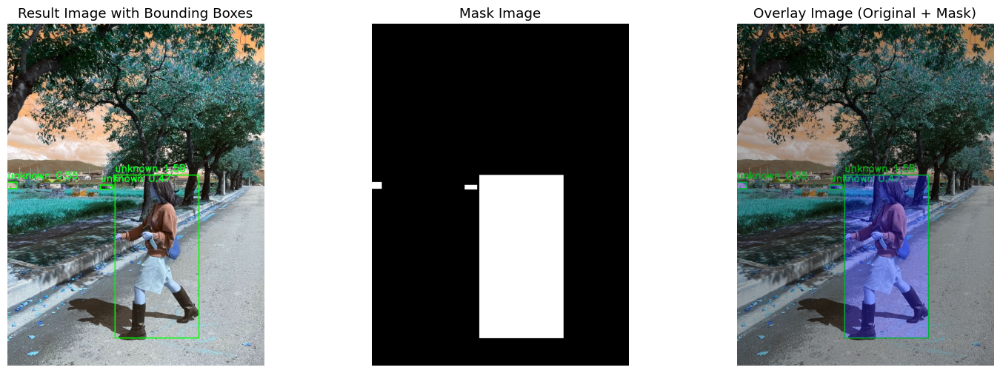

In [3]:
# 주피터 노트북에서 이미지가 보이도록 설정
%matplotlib inline

# 결과 저장 및 출력 함수
def save_and_display_results(results, save_dir):
    os.makedirs(save_dir, exist_ok=True)

    for i, (im, pred) in enumerate(zip(results.ims, results.pred)):
        # OpenCV에서 쓰기 가능한 복사본 생성
        im_copy = np.copy(im)

        # 파일 이름 설정
        img_name = f"result_{i}.jpg"
        mask_name = f"mask_{i}.jpg"
        overlay_name = f"overlay_{i}.jpg"

        # 빈 마스크 생성
        mask = np.zeros(im.shape[:2], dtype=np.uint8)

        for *xyxy, conf, cls in pred:
            cls_idx = int(cls)
            cls_name = model_classes[cls_idx] if cls_idx < len(model_classes) else 'unknown'
            print(f"Detected {cls_name} with confidence {conf:.2f}")

            # 바운딩 박스 및 라벨 그리기
            x1, y1, x2, y2 = map(int, xyxy)
            cv2.rectangle(im_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
            label = f'{cls_name} {conf:.2f}'
            cv2.putText(im_copy, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 
                        0.9, (36, 255, 12), 2)
            
            # 마스크 생성
            cv2.rectangle(mask, (x1, y1), (x2, y2), 255, -1)

        # 결과 이미지 저장
        save_path = os.path.join(save_dir, img_name)
        cv2.imwrite(save_path, im_copy)

        # 마스크 저장
        mask_path = os.path.join(save_dir, mask_name)
        cv2.imwrite(mask_path, mask)

        # 오버레이 이미지 생성 (마스크를 빨간색으로 입혀서 합성)
        colored_mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
        colored_mask[:, :, 1:] = 0  # 빨간색만 유지
        overlay = cv2.addWeighted(im_copy, 0.7, colored_mask, 0.3, 0)

        # 오버레이 이미지 저장
        overlay_path = os.path.join(save_dir, overlay_name)
        cv2.imwrite(overlay_path, overlay)

        print(f"이미지 저장 완료: {save_path}")
        print(f"마스크 저장 완료: {mask_path}")
        print(f"오버레이 저장 완료: {overlay_path}")

        # 결과 시각화
        plt.figure(figsize=(18, 6))

        plt.subplot(1, 3, 1)
        plt.title("Result Image with Bounding Boxes")
        plt.imshow(cv2.cvtColor(im_copy, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title("Mask Image")
        plt.imshow(mask, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title("Overlay Image (Original + Mask)")
        plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.show()

# 이미지 경로
img_path = r"/aiffel/aiffel/human_segmentation/images/my_image_2.png"

# 결과 저장 폴더
result_folder = "./results"
os.makedirs(result_folder, exist_ok=True)

# 세그멘테이션 수행
results = model.predict(img_path)

# 결과 저장 및 출력
save_and_display_results(results, result_folder)

/aiffel/yolov5-env/lib/python3.9/site-packages/yolov5/models/common.py:676: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Detected unknown with confidence 1.72
Detected unknown with confidence 1.68
Detected unknown with confidence 1.52
Detected unknown with confidence 1.46
Detected unknown with confidence 1.43
Detected unknown with confidence 1.35
Detected unknown with confidence 1.31
Detected unknown with confidence 1.30
Detected unknown with confidence 1.29
Detected unknown with confidence 1.27
Detected unknown with confidence 1.26
Detected unknown with confidence 1.22
Detected unknown with confidence 1.21
Detected unknown with confidence 1.17
Detected unknown with confidence 1.15
Detected unknown with confidence 1.13
Detected unknown with confidence 1.11
Detected unknown with confidence 1.10
Detected unknown with confidence 1.07
Detected unknown with confidence 1.04
Detected unknown with confidence 1.02
Detected unknown with confidence 1.02
Detected unknown with confidence 1.00
Detected unknown with confidence 0.98
Detected unknown with confidence 0.95
Detected unknown with confidence 0.94
Detected unk

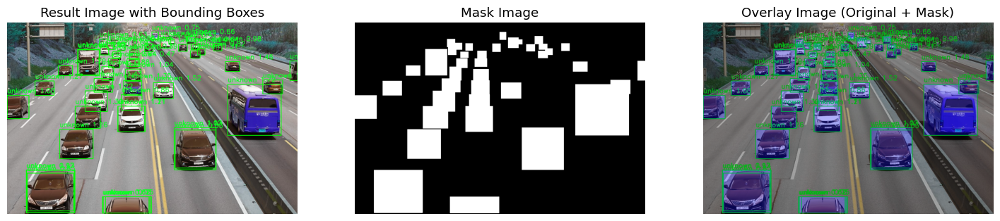

In [4]:
# 결과 저장 및 출력 함수
def save_and_display_results(results, save_dir):
    os.makedirs(save_dir, exist_ok=True)

    for i, (im, pred) in enumerate(zip(results.ims, results.pred)):
        # OpenCV에서 쓰기 가능한 복사본 생성
        im_copy = np.copy(im)

        # 파일 이름 설정
        img_name = f"result_{i}.jpg"
        mask_name = f"mask_{i}.jpg"
        overlay_name = f"overlay_{i}.jpg"

        # 빈 마스크 생성
        mask = np.zeros(im.shape[:2], dtype=np.uint8)

        for *xyxy, conf, cls in pred:
            cls_idx = int(cls)
            cls_name = model_classes[cls_idx] if cls_idx < len(model_classes) else 'unknown'
            print(f"Detected {cls_name} with confidence {conf:.2f}")

            # 바운딩 박스 및 라벨 그리기
            x1, y1, x2, y2 = map(int, xyxy)
            cv2.rectangle(im_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
            label = f'{cls_name} {conf:.2f}'
            cv2.putText(im_copy, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 
                        0.9, (36, 255, 12), 2)
            
            # 마스크 생성
            cv2.rectangle(mask, (x1, y1), (x2, y2), 255, -1)

        # 결과 이미지 저장
        save_path = os.path.join(save_dir, img_name)
        cv2.imwrite(save_path, im_copy)

        # 마스크 저장
        mask_path = os.path.join(save_dir, mask_name)
        cv2.imwrite(mask_path, mask)

        # 오버레이 이미지 생성 (마스크를 빨간색으로 입혀서 합성)
        colored_mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
        colored_mask[:, :, 1:] = 0  # 빨간색만 유지
        overlay = cv2.addWeighted(im_copy, 0.7, colored_mask, 0.3, 0)

        # 오버레이 이미지 저장
        overlay_path = os.path.join(save_dir, overlay_name)
        cv2.imwrite(overlay_path, overlay)

        print(f"이미지 저장 완료: {save_path}")
        print(f"마스크 저장 완료: {mask_path}")
        print(f"오버레이 저장 완료: {overlay_path}")

        # 결과 시각화
        plt.figure(figsize=(18, 6))

        plt.subplot(1, 3, 1)
        plt.title("Result Image with Bounding Boxes")
        plt.imshow(cv2.cvtColor(im_copy, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title("Mask Image")
        plt.imshow(mask, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title("Overlay Image (Original + Mask)")
        plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.show()

# 이미지 경로
img_path = r"/aiffel/aiffel/human_segmentation/images/my_image_4.png"

# 결과 저장 폴더
result_folder = "./results"
os.makedirs(result_folder, exist_ok=True)

# 세그멘테이션 수행
results = model.predict(img_path)

# 결과 저장 및 출력
save_and_display_results(results, result_folder)

**2. YOLO-NAS-S 모델**

In [5]:
import matplotlib.pyplot as plt
from super_gradients.training import models

[2025-03-12 07:20:29] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /aiffel/sg_logs/console.log


In [6]:
# 1. YOLO-NAS-S 모델을 checkpoint로 로드
model = torch.load('/aiffel/.cache/torch/hub/checkpoints/yolo_nas_s_coco.pth')

# 2. 이미지 경로
img_path = '/aiffel/aiffel/human_segmentation/images/my_image_2.png'
img = cv2.imread(img_path)

# 3. 예측 수행
prediction = model.predict(img, conf=0.3)

# 4. 예측 결과 속성 확인
print("Available attributes:", dir(prediction))

# 5. 결과 처리 및 시각화
try:
    bboxes = prediction.bboxes_xyxy
    labels = prediction.class_names
    scores = prediction.confidence

    if len(bboxes) == 0:
        print("탐지된 객체가 없습니다.")
    else:
        overlay_img = img.copy()

        for bbox, label, score in zip(bboxes, labels, scores):
            x1, y1, x2, y2 = map(int, bbox)
            cv2.rectangle(overlay_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            label_text = f"{label} {score:.2f}"
            cv2.putText(overlay_img, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (36, 255, 12), 2)

        # 결과 출력
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

except AttributeError as e:
    print("Error accessing prediction attributes:", e)

/aiffel/yolov5-env/lib/python3.9/site-packages/super_gradients/training/pipelines/pipelines.py:210: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with eval_mode(self.model), torch.no_grad(), torch.cuda.amp.autocast(enabled=self.fp16):
[2025-03-12 07:20:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Available attributes: ['__abstractmethods__', '__annotations__', '__class__', '__dataclass_fields__', '__dataclass_params__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__slots__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', 'class_names', 'draw', 'image', 'prediction', 'save', 'show']
Error accessing prediction attributes: 'ImageDetectionPrediction' object has no attribute 'bboxes_xyxy'


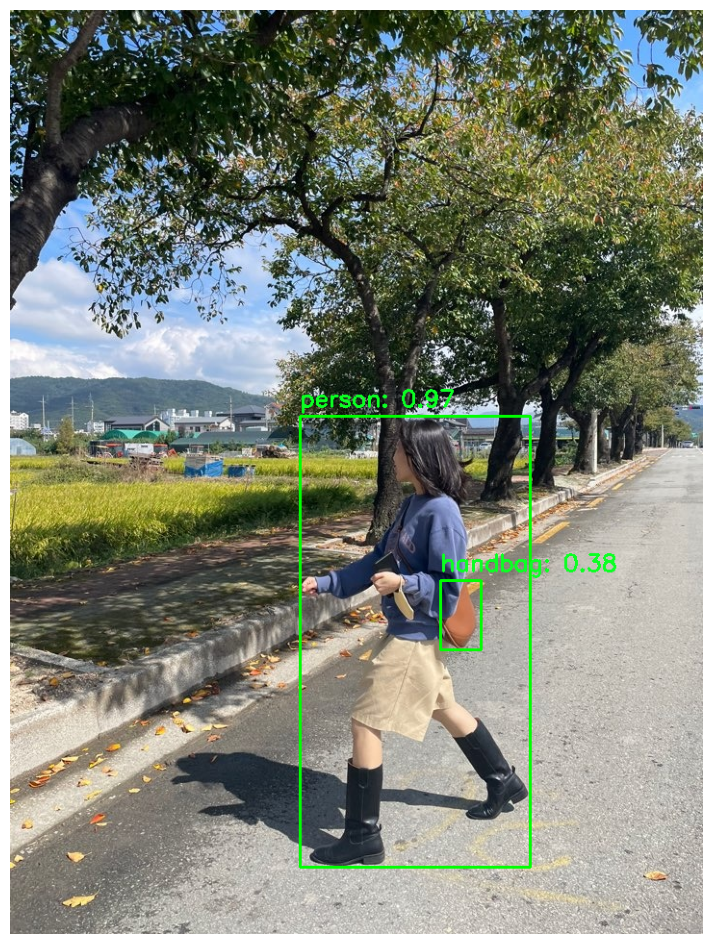

In [7]:
# 1. 바운딩 박스, 신뢰도, 라벨 정보 가져오기
bboxes = prediction.prediction.bboxes_xyxy
scores = prediction.prediction.confidence
labels = prediction.prediction.labels

# 2. 클래스 이름이 없을 경우, COCO 클래스 이름 사용 (또는 사용자 정의 가능)
COCO_CLASSES = [
    'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train',
    'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep',
    'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard',
    'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
    'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork',
    'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange',
    'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair',
    'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv',
    'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave',
    'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase',
    'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

# 3. 이미지 복사본 생성
overlay_img = img.copy()

# 4. 바운딩 박스 및 라벨 그리기
for bbox, score, label in zip(bboxes, scores, labels):
    x1, y1, x2, y2 = map(int, bbox)
    label_name = COCO_CLASSES[label] if label < len(COCO_CLASSES) else f"Class {label}"
    label_text = f"{label_name}: {score:.2f}"

    # 바운딩 박스 그리기
    cv2.rectangle(overlay_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # 라벨 및 신뢰도 표시
    cv2.putText(overlay_img, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 
                0.8, (36, 255, 12), 2)

# 5. 결과 시각화
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

[2025-03-12 07:20:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


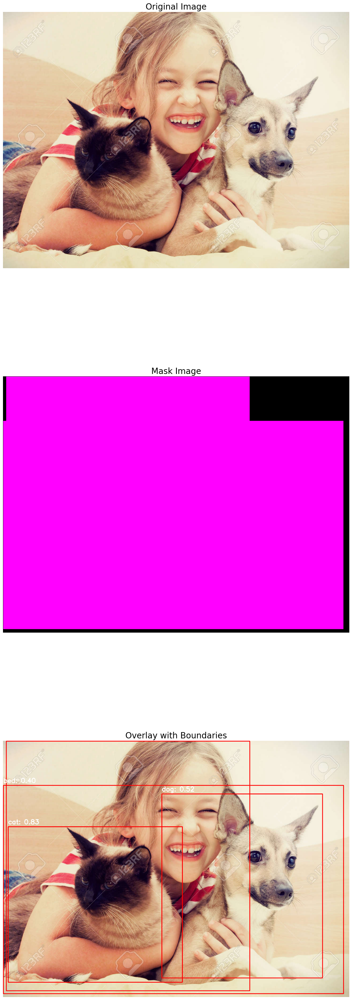

In [8]:
# 2. 이미지 로드
img_path = '/aiffel/aiffel/human_segmentation/images/my_image_3.png'
img = cv2.imread(img_path)

# 3. 예측 (conf 낮게, iou 높게)
prediction = model.predict(img, conf=0.3, iou=0.5).prediction

# 4. 결과 처리
bboxes, scores, labels = prediction.bboxes_xyxy, prediction.confidence, prediction.labels

COCO_CLASSES = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train',
                'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign',
                'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep',
                'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella',
                'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard',
                'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
                'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork',
                'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange',
                'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair',
                'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv',
                'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave',
                'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase',
                'scissors', 'teddy bear', 'hair drier', 'toothbrush']

# 5. 마스크 및 오버레이 생성
mask_img = np.zeros_like(img)
overlay_img = img.copy()

for bbox, score, label in zip(bboxes, scores, labels):
    x1, y1, x2, y2 = map(int, bbox)
    label_name = COCO_CLASSES[label] if label < len(COCO_CLASSES) else f"Class {label}"
    label_text = f"{label_name}: {score:.2f}"

    # 마스크 및 윤곽선 그리기
    mask_img[y1:y2, x1:x2] = [255, 0, 255]
    cv2.rectangle(overlay_img, (x1, y1), (x2, y2), (255, 0, 255), 2)
    cv2.putText(overlay_img, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

    # 세밀한 경계선 추가 (Contour)
    contour = np.array([[x1, y1], [x2, y1], [x2, y2], [x1, y2]])
    cv2.polylines(overlay_img, [contour], isClosed=True, color=(0, 0, 255), thickness=2)

# 6. 최종 시각화
titles = ['Original Image', 'Mask Image', 'Overlay with Boundaries']
images = [img, mask_img, overlay_img]

plt.figure(figsize=(15, 45))
for i, (title, image) in enumerate(zip(titles, images)):
    plt.subplot(3, 1, i+1)
    plt.title(title, fontsize=20)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
plt.show()

[2025-03-12 07:20:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


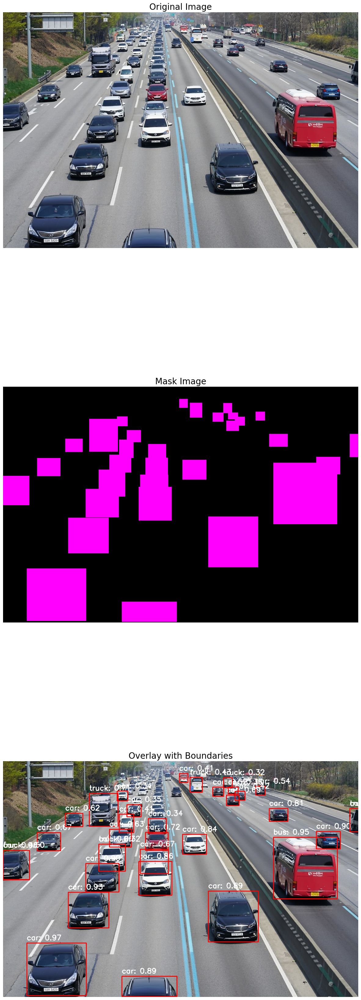

In [9]:
# 1. 모델 로드
checkpoint = torch.load('/aiffel/.cache/torch/hub/checkpoints/yolo_nas_s_coco.pth')
model = checkpoint
model.eval()

# 2. 이미지 로드
img_path = '/aiffel/aiffel/human_segmentation/images/my_image_4.png'
img = cv2.imread(img_path)

# 3. 예측 (conf 낮게, iou 높게)
prediction = model.predict(img, conf=0.3, iou=0.5).prediction

# 4. 결과 처리
bboxes, scores, labels = prediction.bboxes_xyxy, prediction.confidence, prediction.labels

COCO_CLASSES = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train',
                'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign',
                'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep',
                'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella',
                'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard',
                'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
                'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork',
                'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange',
                'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair',
                'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv',
                'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave',
                'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase',
                'scissors', 'teddy bear', 'hair drier', 'toothbrush']

# 5. 마스크 및 오버레이 생성
mask_img = np.zeros_like(img)
overlay_img = img.copy()

for bbox, score, label in zip(bboxes, scores, labels):
    x1, y1, x2, y2 = map(int, bbox)
    label_name = COCO_CLASSES[label] if label < len(COCO_CLASSES) else f"Class {label}"
    label_text = f"{label_name}: {score:.2f}"

    # 마스크 및 윤곽선 그리기
    mask_img[y1:y2, x1:x2] = [255, 0, 255]
    cv2.rectangle(overlay_img, (x1, y1), (x2, y2), (255, 0, 255), 2)
    cv2.putText(overlay_img, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

    # 세밀한 경계선 추가 (Contour)
    contour = np.array([[x1, y1], [x2, y1], [x2, y2], [x1, y2]])
    cv2.polylines(overlay_img, [contour], isClosed=True, color=(0, 0, 255), thickness=2)

# 6. 최종 시각화
titles = ['Original Image', 'Mask Image', 'Overlay with Boundaries']
images = [img, mask_img, overlay_img]

plt.figure(figsize=(15, 45))
for i, (title, image) in enumerate(zip(titles, images)):
    plt.subplot(3, 1, i+1)
    plt.title(title, fontsize=20)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
plt.show()

**3. YOLOv8 모델**

In [2]:
from ultralytics import YOLO

# YOLOv8 모델 로드
model = YOLO('yolov8s-seg.pt')

# 이미지 경로
img_path = r"/aiffel/aiffel/human_segmentation/images/my_image_2.png"

# YOLOv8 세그멘테이션 수행
results = model(img_path, save=True)

# 결과 가져오기
first_result = results[0]

# 저장된 디렉토리 가져오기
save_dir = first_result.save_dir


image 1/1 /aiffel/aiffel/human_segmentation/images/my_image_2.png: 640x480 1 person, 1 handbag, 728.7ms
Speed: 6.0ms preprocess, 728.7ms inference, 9.6ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/segment/predict23


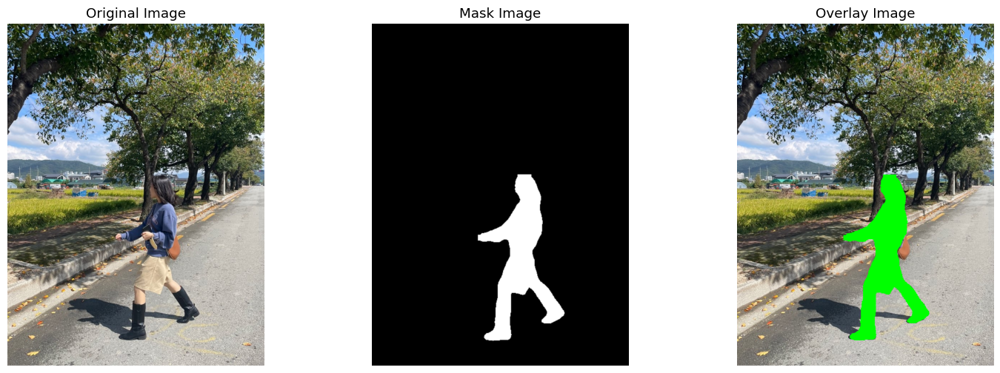

In [11]:
# 저장된 원본 이미지 경로
saved_img_path = os.path.join(save_dir, 'my_image_2.jpg')

# 원본 이미지 로드
original_img = cv2.imread(img_path)

# 마스크 생성
if hasattr(first_result, 'masks') and first_result.masks is not None and len(first_result.masks.data) > 0:
    # 첫 번째 마스크 가져오기 및 크기 맞추기
    mask = first_result.masks.data[0].cpu().numpy()
    mask = (mask * 255).astype(np.uint8)
    
    # 마스크를 원본 이미지 크기로 리사이즈
    mask = cv2.resize(mask, (original_img.shape[1], original_img.shape[0]))
else:
    print("마스크가 없습니다.")
    mask = np.zeros(original_img.shape[:2], dtype=np.uint8)

# 원본 + 마스크 합성 이미지 만들기
overlay_img = original_img.copy()
overlay_img[mask == 255] = [0, 255, 0]  # 마스크 영역을 초록색으로 표시

# 이미지 출력
plt.figure(figsize=(18, 6))

# 원본 이미지
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
plt.axis('off')

# 마스크 이미지
plt.subplot(1, 3, 2)
plt.title("Mask Image")
plt.imshow(mask, cmap='gray')
plt.axis('off')

# 원본 + 마스크 합성 이미지
plt.subplot(1, 3, 3)
plt.title("Overlay Image")
plt.imshow(cv2.cvtColor(overlay_img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()


image 1/1 /aiffel/aiffel/human_segmentation/images/my_image_2.png: 640x480 1 person, 1 handbag, 652.4ms
Speed: 3.1ms preprocess, 652.4ms inference, 8.6ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/segment/predict20


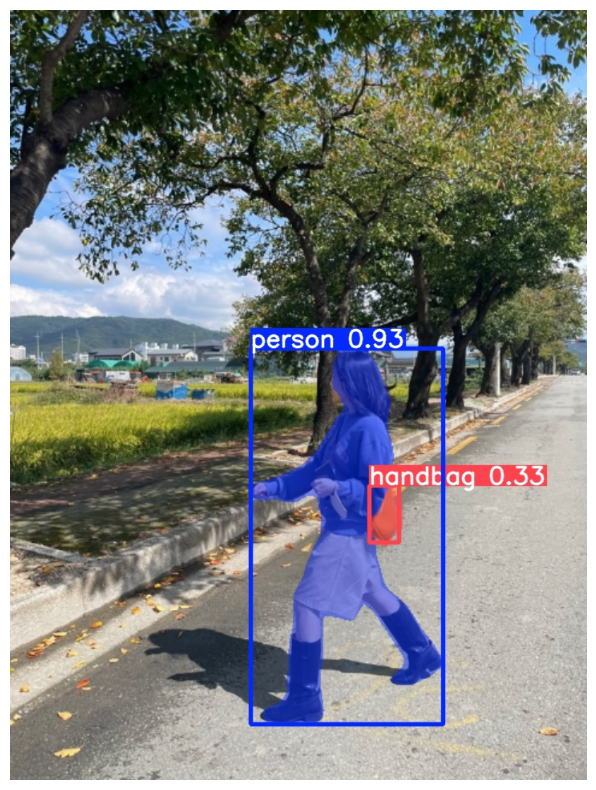

In [12]:
# YOLOv8 모델 로드
model = YOLO('yolov8s-seg.pt')

# 이미지 경로
img_path = r"/aiffel/aiffel/human_segmentation/images/my_image_2.png"

# YOLOv8 세그멘테이션 수행
results = model(img_path, save=True)

# 마지막 저장된 디렉토리 가져오기
save_dir = results[0].save_dir

# 저장된 이미지 경로
saved_img_path = os.path.join(save_dir, 'my_image_2.jpg')

# 파일 존재 여부 확인 및 출력
if os.path.exists(saved_img_path):
    img = cv2.imread(saved_img_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
else:
    print(f"파일을 찾을 수 없습니다: {saved_img_path}")


image 1/1 /aiffel/aiffel/human_segmentation/images/my_image_3.png: 480x640 2 persons, 2 cats, 1 dog, 830.5ms
Speed: 3.4ms preprocess, 830.5ms inference, 18.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/segment/predict21


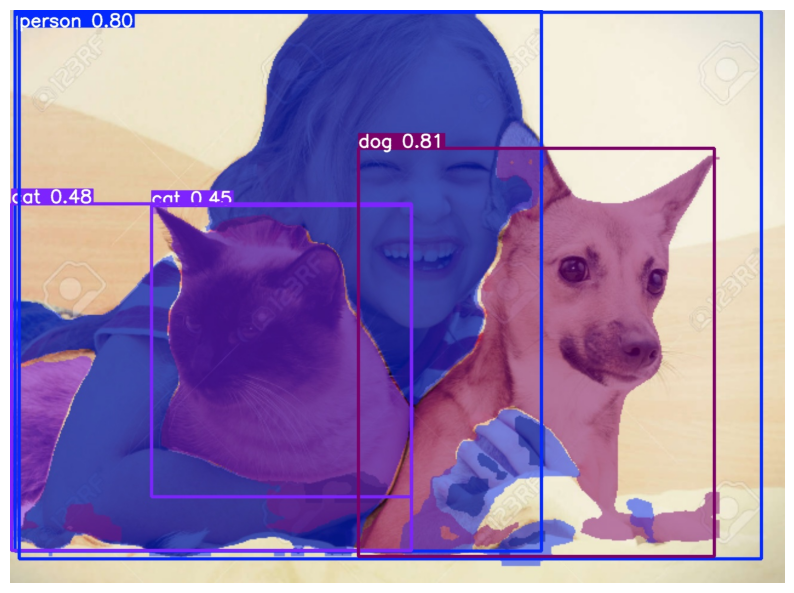

In [13]:
# YOLOv8 모델 로드
model = YOLO('yolov8s-seg.pt')

# 이미지 경로
img_path = r"/aiffel/aiffel/human_segmentation/images/my_image_3.png"

# YOLOv8 세그멘테이션 수행
results = model(img_path, save=True)

# 마지막 저장된 디렉토리 가져오기
save_dir = results[0].save_dir

# 저장된 이미지 경로
saved_img_path = os.path.join(save_dir, 'my_image_3.jpg')

# 파일 존재 여부 확인 및 출력
if os.path.exists(saved_img_path):
    img = cv2.imread(saved_img_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
else:
    print(f"파일을 찾을 수 없습니다: {saved_img_path}")


image 1/1 /aiffel/aiffel/human_segmentation/images/my_image_4.png: 448x640 31 cars, 1 bus, 4 trucks, 713.1ms
Speed: 3.1ms preprocess, 713.1ms inference, 164.2ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/segment/predict22


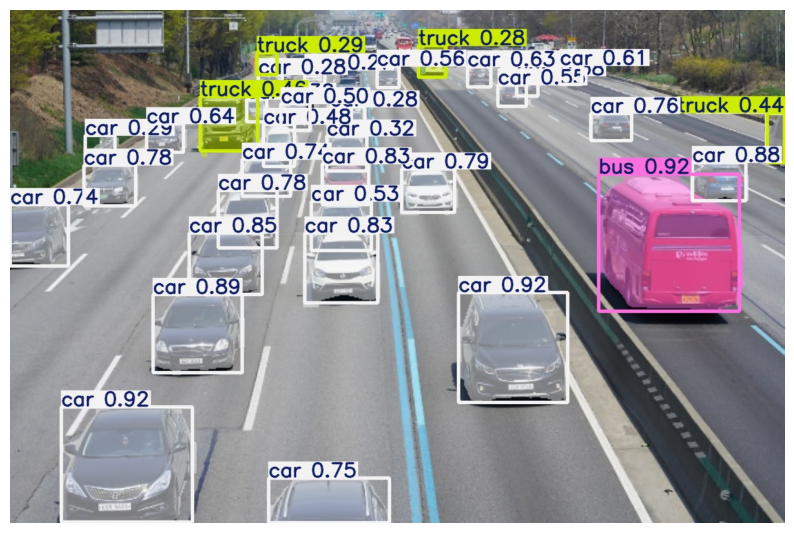

In [14]:
# YOLOv8 모델 로드
model = YOLO('yolov8s-seg.pt')

# 이미지 경로
img_path = r"/aiffel/aiffel/human_segmentation/images/my_image_4.png"

# YOLOv8 세그멘테이션 수행
results = model(img_path, save=True)

# 마지막 저장된 디렉토리 가져오기
save_dir = results[0].save_dir

# 저장된 이미지 경로
saved_img_path = os.path.join(save_dir, 'my_image_4.jpg')

# 파일 존재 여부 확인 및 출력
if os.path.exists(saved_img_path):
    img = cv2.imread(saved_img_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
else:
    print(f"파일을 찾을 수 없습니다: {saved_img_path}")

### DeepLab + YOLO (미완)

# 회고
- 인물모드 사진의 문제를 해결하기 위해 DeepLab 모델과 YOLO 모델을 결합하려고 시도했으나, 여러 번의 시도 끝에 성공하지 못했습니다. 
- 주된 이유는 TensorFlow, OpenCV, PyTorch 간의 버전 호환성 문제로, DeepLab 모델을 로드하고 YOLO 모델을 함께 사용하는 과정에서 충돌이 발생했기 때문입니다. 
- 그럼에도 불구하고 YOLO 모델의 동작 원리와 적용 방법에 대해 배우는 과정은 매우 유익했습니다.